# MD005 Segundo entregable: Clasificación

## Procesado inicial

In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

import statsmodels.api as sm

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import plotly.express as px

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import StandardScaler

import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from six import StringIO
import pydot
import warnings
from IPython.display import Image

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_predict

Una vez incluidas las librerias me dispongo a obtener los datos del fichero escogido. En mi caso, he elegido el dataset propuesto de league of legends encontrado en el siguiente link: https://www.kaggle.com/datasets/chiniczr/league-of-legends-summoners-and-match-data?resource=download&select=data_all.csv

La parte de limpieza y explicacion de las variables será muy parecida a la de la entrega previa puesto que estoy trabajando con el mismo dataset y el objetivo de esta entrega es parecido a la forma en la que planteé la previa.

In [48]:
dtf = pd.read_csv(r'C:\Users\josep\Downloads\data_all\data_all.csv', sep = ',', encoding = 'latin1', error_bad_lines=False) #error_bad_lines is avoid single line error
dtf.shape[0]
dtf.info()

C:\Users\josep\AppData\Local\Temp\ipykernel_19024\2814331919.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  dtf = pd.read_csv(r'C:\Users\josep\Downloads\data_all\data_all.csv', sep = ',', encoding = 'latin1', error_bad_lines=False) #error_bad_lines is avoid single line error


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260367 entries, 0 to 260366
Data columns (total 43 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   total_blue_barons   260367 non-null  float64
 1   total_blue_drakes   260367 non-null  float64
 2   total_blue_heralds  260367 non-null  float64
 3   total_blue_inhibs   260367 non-null  float64
 4   total_blue_kills    260367 non-null  float64
 5   total_blue_turrets  260367 non-null  float64
 6   blue_first_blood    260367 non-null  float64
 7   blue_first_herald   260367 non-null  float64
 8   blue_first_drake    260367 non-null  float64
 9   blue_first_baron    260367 non-null  float64
 10  blue_first_inhib    260367 non-null  float64
 11  blue_first_turret   260367 non-null  float64
 12  total_blue_vs       260358 non-null  float64
 13  total_blue_gold     260367 non-null  float64
 14  med_blue_kills      260367 non-null  float64
 15  med_blue_xp         260367 non-nul

Al igual que en la entrega anterior voy a deshacerme de los posibles NA (no hay ninguno) y voy a dividir los datos entre equipo rojo y equipo azul. Tambien, al igual que en la entrega anterior me desharé de aquellos datos que no tengan sentido, como partidas sin kills ni torres y lo aplicaré todo seguido para evitar que se haga repetitivo respecto a la entrega anterior.

In [4]:
dtf = dtf.dropna()

remakes = dtf[dtf['total_blue_turrets'] == 0]
remakes = remakes[remakes['total_red_turrets'] == 0]

merged_df = dtf.merge(remakes, indicator=True, how='left')
dtf2 = merged_df[merged_df['_merge'] == 'left_only']
dtf = dtf2.drop(columns=['_merge'])

outlier = dtf[dtf['total_red_kills'] == 0]
outlier = outlier[outlier['winning_team'] == 1]

outlier_condition = (dtf['winning_team'] == 1) & (dtf['total_red_kills'] == 0)
dtf = dtf[~outlier_condition]

dtf_red = dtf.filter(regex='(red|winning_team)')
dtf_blue = dtf.filter(regex='(blue|winning_team)')
dtf_red.describe()

,total_red_barons,total_red_drakes,total_red_heralds,total_red_inhibs,total_red_kills,total_red_turrets,red_first_blood,red_first_herald,red_first_drake,red_first_baron,...,total_red_vs,total_red_gold,med_red_kills,med_red_xp,med_red_gold,med_red_dmg,red_got_soul,total_red_elders,med_red_vs,winning_team
count,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,...,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000,258286.000000
mean,0.363105,0.504250,0.463482,0.402568,0.496255,0.493927,0.488586,0.462518,0.512444,0.362807,...,0.496957,0.499357,0.492156,0.500310,0.499193,0.497810,0.120940,0.022543,0.498273,0.495273
std,0.455714,0.353926,0.431874,0.464142,0.154863,0.318068,0.499871,0.498594,0.499846,0.480811,...,0.066928,0.053830,0.184858,0.048040,0.056496,0.085000,0.326058,0.146505,0.075722,0.499979
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.025000,0.308279,0.000000,0.264141,0.260425,0.122982,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.250000,0.000000,0.000000,0.375000,0.214286,0.000000,0.000000,0.000000,0.000000,...,0.453202,0.455484,0.360000,0.458405,0.454576,0.436846,0.000000,0.000000,0.449664,0.000000
50%,0.000000,0.500000,0.500000,0.000000,0.495327,0.500000,0.000000,0.000000,1.000000,0.000000,...,0.496970,0.498765,0.500000,0.499725,0.499009,0.497695,0.000000,0.000000,0.500000,0.000000
75%,1.000000,0.800000,1.000000,1.000000,0.617021,0.769231,1.000000,1.000000,1.000000,1.000000,...,0.540741,0.543332,0.625000,0.542484,0.543863,0.558497,0.000000,0.000000,0.547059,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.906250,0.697141,1.000000,0.827078,0.714896,0.955552,1.000000,1.000000,1.000000,1.000000


### Eleccion variables clasificación binaria

Para evitar repetitividad entre entregas haré un resumen de la informacion más importante que observé en el analisis de las variables en la entrega anterior.

**Variable objetivo:** La variable que será usada como variable objetivo en el analisis será la de winning_team que nos indica si el equipo ganó la partida, esta variable es binaria. Un valor de **0** significa **derrota** y un valor de **1 victoria**. 

**Analisis de correlaciones:** En este analisis observamos como las varibles con una mayor correlacion con la variable objetivo eran:
* total_red_inhibs: Porcentage de inhibidores destruidos por el equipo.
* total_red_kills: Porcentage de asesinatos hechos por el equipo.
* total_red_turrets: Porcentage de torres destruidas por el equipo.
* total_red_gold: Porcentage de oro generado por el equipo.

**Test Anova:** Los resultados de este test no fueron muy útiles ya que al usar porcentajes del total, los datos no son los mejores para realizar un ANOVA, y eso se vio en los resultados donde todos los p valores eran de 0.0 y los F valores eran desmesuradamente altos.

A continuacion realizaré un analisis de componentes (PCA).

In [103]:
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(dtf_red)

# Resultados
print("Varianza explicada por cada componente:", pca.explained_variance_ratio_)

Varianza explicada por cada componente: [0.4172725  0.14722865 0.10897791 0.08251848 0.06971594]


In [104]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(dtf_red)

# Resultados
print("Varianza explicada por cada componente:", pca.explained_variance_ratio_)
print("Componentes principales:\n", principalComponents)
print("Cargas de PCA:\n", pca.components_)

Varianza explicada por cada componente: [0.4172725  0.14722865]
Componentes principales:
 [[ 1.29905675  0.83693571]
 [ 1.57652583 -0.04112309]
 [-1.34520522  0.38749238]
 ...
 [-1.1944477   0.41926064]
 [ 1.06347588 -0.35406453]
 [ 0.57992144  0.27843855]]
Cargas de PCA:
 [[ 0.312253    0.23436642  0.20029108  0.3775599   0.11208106  0.25550447
   0.11878021  0.17640748  0.180265    0.31371797  0.38062313  0.26313442
   0.03509631  0.04217371  0.11680013  0.03527968  0.04165865  0.04690314
   0.11210159  0.01393626  0.03445119  0.40127394]
 [ 0.2760005   0.00415867 -0.50250239  0.16449916 -0.01665422 -0.04919342
  -0.1495155  -0.62191312  0.02555174  0.28668055  0.15634595 -0.33724157
  -0.00731187 -0.00701329 -0.02063713  0.00519953 -0.00628341 -0.00634337
   0.08709108  0.01432934 -0.0080352   0.05389832]]


Como observamos a partir del segundo componente la varianza explicada de nuevos componentes es practicamente negligible. En general, vemos que conseguimos poca varianza explicada y con la PCA perdemos bastante información así que los resultados puede que no sean del todo significativos así que mejor no le haremos demasiado caso.

Ahora haré un IGA para usar la entropía con tal de ver la información mutua entre el target y las covariables.

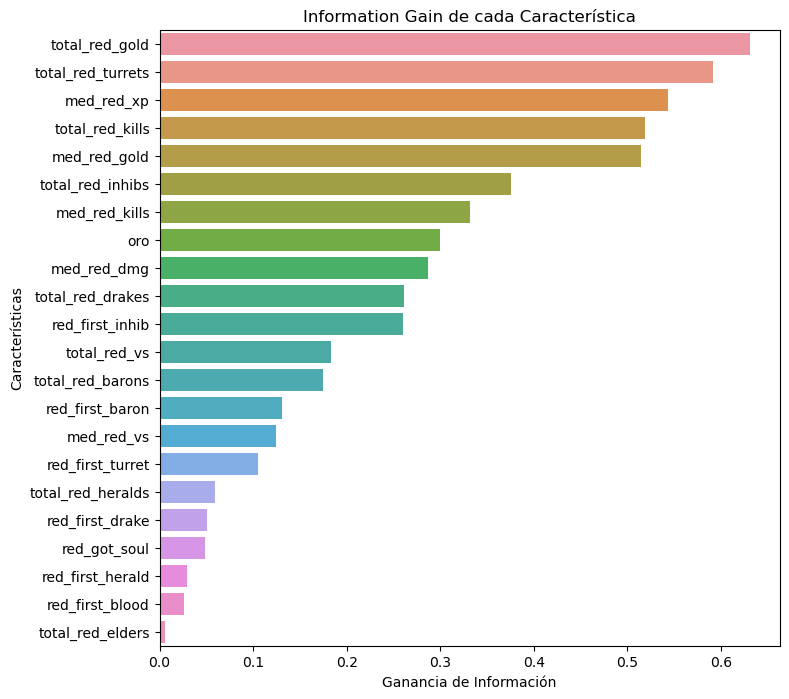

In [91]:
def calculate_information_gain(X, y):
    mi = mutual_info_classif(X, y)
    mi = pd.Series(mi, index=X.columns)
    mi = mi.sort_values(ascending=False)
    return mi

X = dtf_red.drop('winning_team', axis=1)
y = dtf_red['winning_team']
mi_scores = calculate_information_gain(X, y)

# Visualizar
plt.figure(figsize=(8, 8))
sns.barplot(x=mi_scores, y=mi_scores.index)
plt.title('Information Gain de cada Característica')
plt.xlabel('Ganancia de Información')
plt.ylabel('Características')
plt.show()

Los resultados obtenidos son muy parecidos a aquellos obtenidos en el analisis de correlaciones lo que le da aún más validez a esa elección de variables. Las cuales para la clasificacion binaria almenos, serán las mismas que en la entrega pasada. 

In [21]:
data_bin = dtf_red[['total_red_inhibs','total_red_kills', 'total_red_turrets', 'total_red_gold', 'winning_team']]
data_bin

,total_red_inhibs,total_red_kills,total_red_turrets,total_red_gold,winning_team
0,1.000,0.703704,0.615385,0.545251,1
1,1.000,0.617021,0.800000,0.550159,1
2,0.000,0.420000,0.222222,0.457899,0
3,1.000,0.675000,0.800000,0.556320,1
4,0.000,0.694444,0.750000,0.550850,1
...,...,...,...,...,...
261363,1.000,0.611111,0.571429,0.528852,1
261364,0.250,0.480519,0.500000,0.520899,1
261365,0.000,0.258065,0.307692,0.455437,0
261366,0.875,0.479592,0.611111,0.492918,0


### Eleccion variables clasificación multiclase

Para la clasificacion multiclase, al no tener una variable categoria con mas de 2 categorias, me la cocinaré yo mismo. Para ello, dividiré la variable de oro conseguido en 5 rangos: 
* [0 - 0.35] Humillación. >>> 1
* [0.35 - 0.45] Mala partida. >>> 2
* [0.45 - 0.55] Partida muy igualada. >>> 3
* [0.55 - 0.65] Buena partida. >>> 4
* [0.65 - 1.0] Stompeada. >>> 5

In [151]:
def transformar_valor(valor):
    if valor < 0.35:
        return 1
    elif valor < 0.45:
        return 2
    elif valor < 0.55:
        return 3
    elif valor < 0.65:
        return 4
    else:
        return 5

# Aplicar la transformación
dtf_red['oro'] = dtf_red['total_red_gold'].apply(transformar_valor)

# Mostrar los resultados
print(dtf_red[['oro', 'total_red_gold']])

        oro  total_red_gold
0         3        0.545251
1         4        0.550159
2         3        0.457899
3         4        0.556320
4         4        0.550850
...     ...             ...
261363    3        0.528852
261364    3        0.520899
261365    3        0.455437
261366    3        0.492918
261367    3        0.517425

[258286 rows x 2 columns]


De este modo buscaré determinar como ha ido una partida en cuanto a oro generado usando el resto de variables.

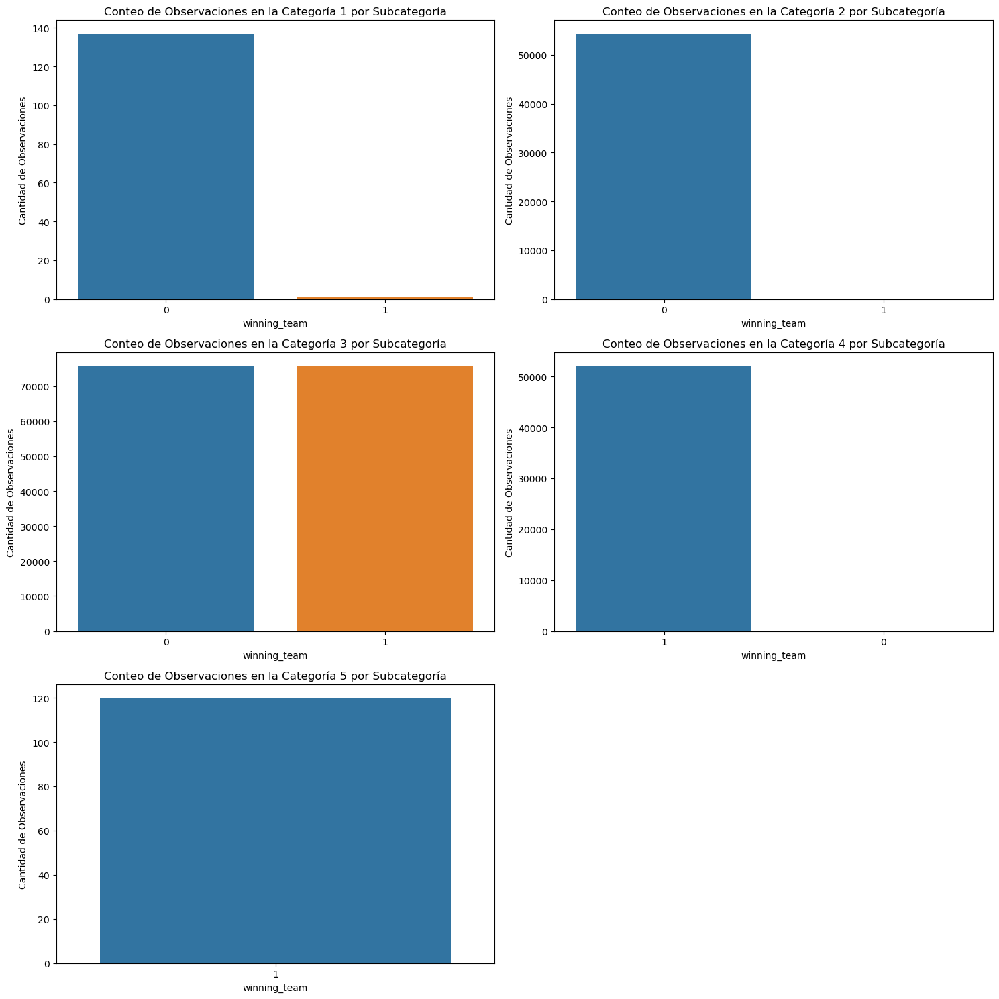

In [152]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))  # Ajusta el tamaño según tus necesidades
axes = axes.flatten()  # Esto hace más fácil la iteración

# Iterar sobre cada categoría principal y cada subtrama
for i, categoria in enumerate(range(1, 6)):
    # Filtrar el DataFrame por la categoría principal
    df_filtrado = dtf_red[dtf_red['oro'] == categoria]

    # Verificar si hay datos en el subconjunto filtrado
    if not df_filtrado.empty:
        # Definir el orden basado en el subconjunto filtrado
        order = df_filtrado['winning_team'].value_counts().index

        # Crear un gráfico de barras en la subtrama correspondiente
        ax = sns.countplot(x='winning_team', data=df_filtrado, order=order, ax=axes[i])
        ax.set_title(f'Conteo de Observaciones en la Categoría {categoria} por Subcategoría')
        ax.set_xlabel('winning_team')
        ax.set_ylabel('Cantidad de Observaciones')
    else:
        axes[i].set_visible(False)

# Ocultar la subtrama vacía (si es necesario)
if len(range(1, 6)) < len(axes):
    for j in range(len(range(1, 6)), len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Como se observa, la inmensa mayoria de partidas que se consideran no igualadas, tiene casi siempre al equipo que ha generado mas oro como vencedor, llegando incluso, en el caso de la categoria de stompeada, a ser el 100% de los casos. Esta gráfica no da demasiada información respecto a las clasificaciones que voy a hacer, ya que esto será para la multiclase y en ese tipo de clasificacion no buscaré clasificar al equipo vencedor. Aún así, es interesante ver como las distribuciones de las victorias son fácilmente predecibles a partir del oro generado.

In [88]:
dtf_red[(dtf_red['oro'] == 5) & (dtf_red['winning_team'] == 0)]

,total_red_barons,total_red_drakes,total_red_heralds,total_red_inhibs,total_red_kills,total_red_turrets,red_first_blood,red_first_herald,red_first_drake,red_first_baron,...,total_red_gold,med_red_kills,med_red_xp,med_red_gold,med_red_dmg,red_got_soul,total_red_elders,med_red_vs,winning_team,oro


Lo comentado anteriormente, no se ha perdido ninguna partida en la cual se haya generado más del 65% del oro.

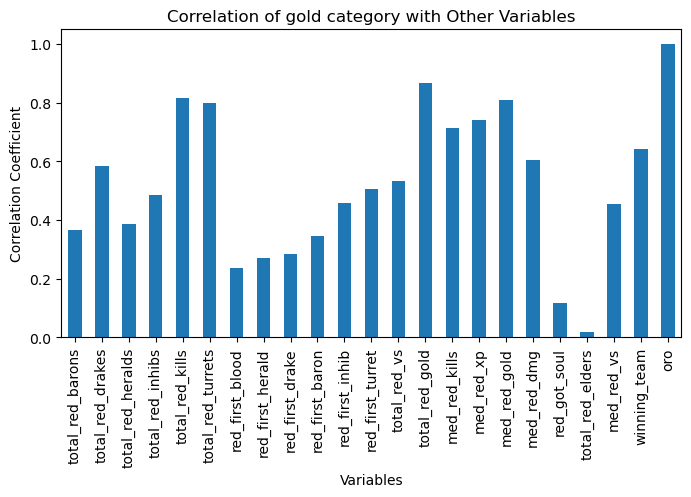

In [89]:
correlation_matrix = dtf_red.corr()
variable1_correlations = correlation_matrix.loc['oro']

plt.figure(figsize=(8, 4))
variable1_correlations.plot(kind='bar')
plt.title('Correlation of gold category with Other Variables')
plt.xlabel('Variables')
plt.ylabel('Correlation Coefficient')
plt.show()

De esta grafica de barras observamos como con fuertes correlaciones, las kills y torres son lo más correlacionado después de las variables de oro que obviamente no usaré para clasificar ya que la variable objetivo a sido generada a raiz de ellas.

No realizaré el test ANOVA ya que para estas variables hemos visto que no era demasiado útil.

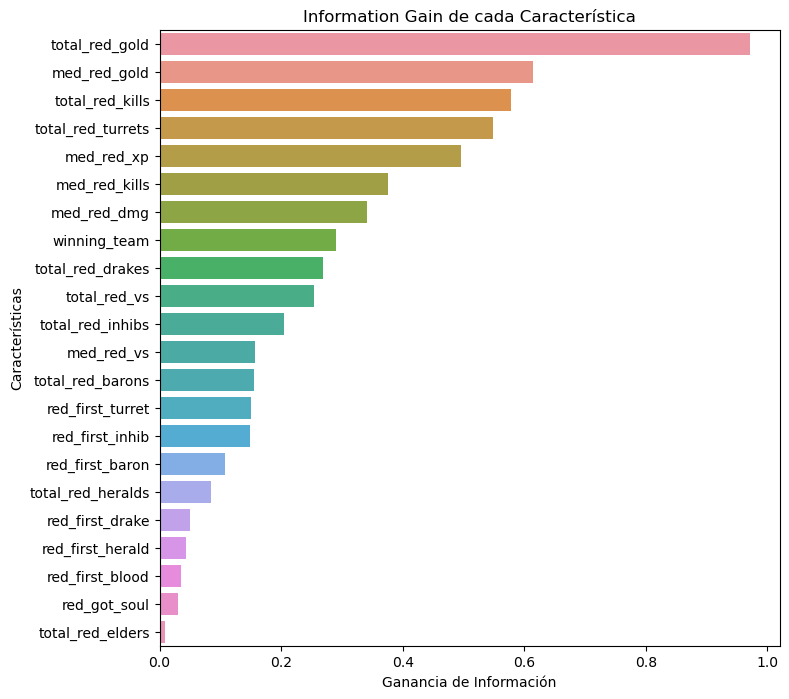

In [92]:
X = dtf_red.drop('oro', axis=1)
y = dtf_red['oro']
mi_scores = calculate_information_gain(X, y)

# Visualizar
plt.figure(figsize=(8, 8))
sns.barplot(x=mi_scores, y=mi_scores.index)
plt.title('Information Gain de cada Característica')
plt.xlabel('Ganancia de Información')
plt.ylabel('Características')
plt.show()

Del mismo modo que con las correlaciones, las variables de oro son las que marcan una mayor correlacion, tras ellas, las mas importantes son las kills y las torres, al igual que con la clasificacion binaria, pero a diferencia de esta, tambien usaremos la variable de la media de experiencia.

In [93]:
data_multi = dtf_red[['med_red_xp','total_red_kills', 'total_red_turrets', 'oro']]
data_multi

,med_red_xp,total_red_kills,total_red_turrets,oro
0,0.563770,0.703704,0.615385,3
1,0.545908,0.617021,0.800000,4
2,0.447661,0.420000,0.222222,3
3,0.561002,0.675000,0.800000,4
4,0.558064,0.694444,0.750000,4
...,...,...,...,...
261363,0.546861,0.611111,0.571429,3
261364,0.536334,0.480519,0.500000,3
261365,0.426852,0.258065,0.307692,3
261366,0.457341,0.479592,0.611111,3


### Analisis variables

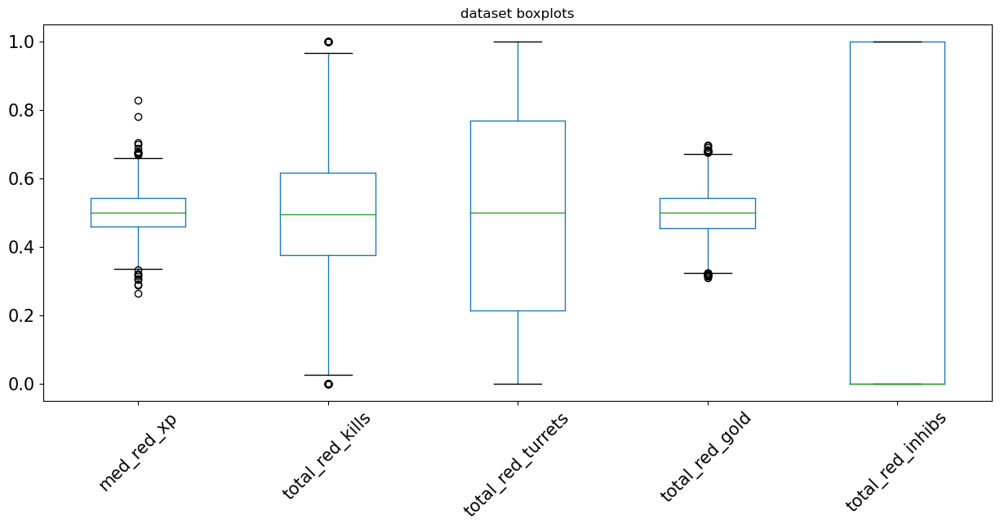

In [113]:
plt.figure(figsize = (15, 6))
plt.title("dataset boxplots")
dataplot = dtf_red[['med_red_xp','total_red_kills', 'total_red_turrets', 'total_red_gold', 'total_red_inhibs']]
dataplot.boxplot(grid=False, rot=45, fontsize=15)
plt.show()

Los boxplots, por la naturaleza de los datos no aportan demasiado información. Todas las variables tienen un rango de valores de 0 a 1 tal y como se ha comentado anteriormente, a excepción del oro y la experiencia que tienen un rango menor ya que es imposible generar el 100% del oro o la experiencia en la partida. Además vemos como la media de las variables es practicamente la mediana en todos los casos y eso denota una distribución bastante equitativa de las muestras.

C:\Users\josep\AppData\Local\Temp\ipykernel_6772\564553006.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  dataplot.hist(ax = ax)


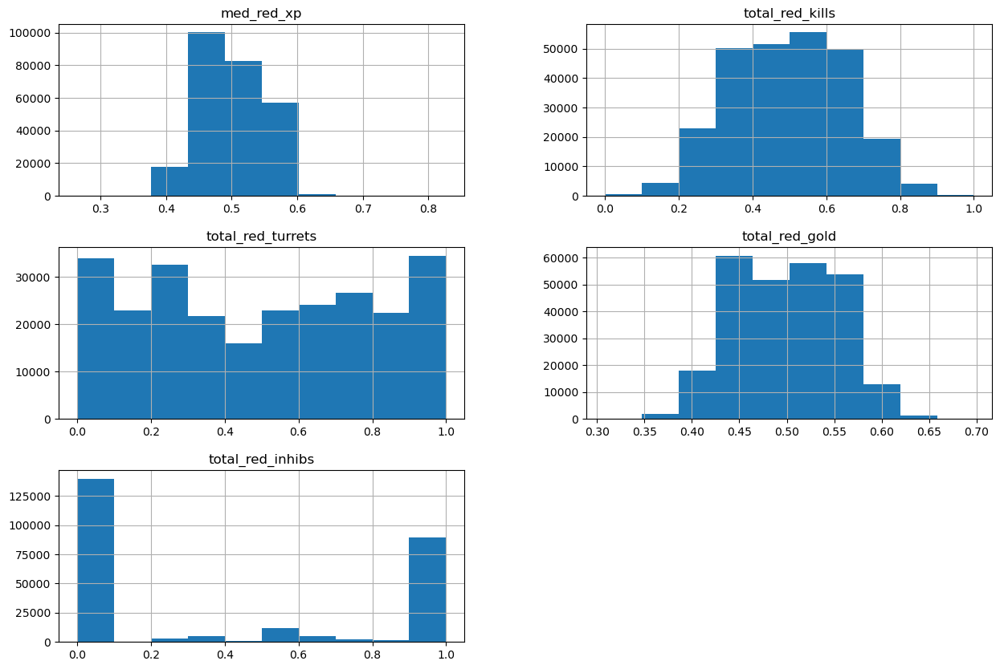

In [114]:
fig = plt.figure(figsize = (15,10))
ax = fig.gca()
dataplot.hist(ax = ax)
plt.show()

Como ya vimos en la entrega previa, las variables de oro y kills siguen distribuciones muy bonitas y parecidas a una normal. La única variable nueva en este análisi es la de experiencia la cual tambien sigue una distribucion bastante parecida a la normal y eso nos gusta puesto que esto nos permite realizar inferencias estadísticas válidas y fiables, como tests de hipótesis y la construcción de intervalos de confianza.

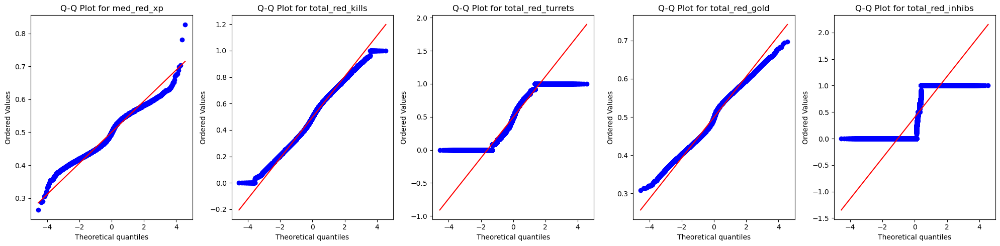

In [115]:
fig, axes = plt.subplots(1, len(dataplot.columns), figsize=(20, 5))  # Ajusta el tamaño según tus necesidades

# Generar un gráfico Q-Q para cada columna
for ax, col in zip(axes, dataplot.columns):
    stats.probplot(dataplot[col], dist="norm", plot=ax)
    ax.set_title(f'Q-Q Plot for {col}')

plt.tight_layout()
plt.show()

Efectivamente, vemos como las variables de experiencia, kills y oro estan muy cerca de la recta que determina la normalidad.

<Figure size 500x2000 with 0 Axes>

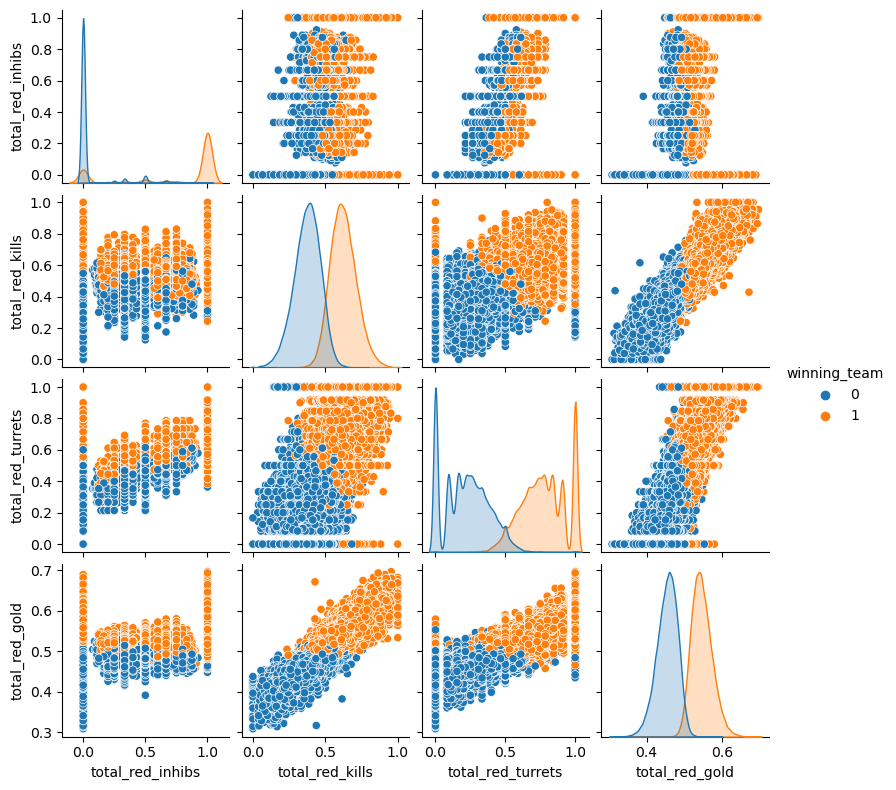

In [117]:
plt.figure(figsize = (5, 20))
sns.pairplot(data_bin,  hue='winning_team', height=2, palette = "tab10")
plt.show()

Como vemos tanto las victorias como las derrotas siguen las mismas distribuciones con distintas medias, a excepción de las torres, que siguen una distribución inversa. Lo más interesante de estas gráficas es que en todas ellas podemos identificar y separar fácilmente las 2 categorias, victoria y derrota.

<Figure size 500x2000 with 0 Axes>

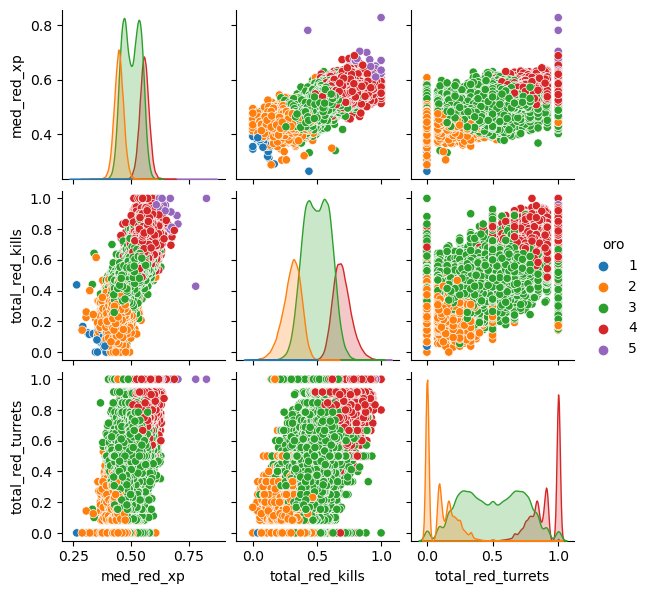

In [119]:
plt.figure(figsize = (5, 20))
sns.pairplot(data_multi,  hue='oro', height=2, palette = "tab10")
plt.show()

Aqui ya no se ven las cosas tan fácilmente, aún así,no deja de ser realmente atractivo a nuestros ojos el como se aprecian tan fácilmente las distintas categorias. Cabe a destacar, que tal y como hemos visto en los graficos de barras las categorias de humillacion y stompeada estan compuestas de una extrema minoria de los datos y por eso son casi inapreciables.

A raíz de estas dos visualizaciones, me podría aventurar a hipotetizar que las clasificaciones, sobretodo en el caso de la binaria, tendrán un resultado muy satisfactorio.

### Conclusiones variables

El tipo de clasificación que he escogido para realizar el problema es el de clasificacion binaria, ya que los datos en sí me lo permiten sin niguna modificacion usando la variable winning_team, sin embargo, tambien realizaré el ejercicio optativo mediante la variable creada oro.

En total, realizaré clasificaciones binarias con los algoritmos de regresión logística, árboles de decision y KNN, y para la clasificación binaria he decidido usar el método de árboles de decision. Lo he decidido así por un par de razones principales, primero de todo los árboles de decision proporcionan un modelo claro y lógico que puede ser fácilmente visualizado y comprendido. Además, el coste de estos es muy menor al del KNN. 

En el caso de la clasificacion binaria con la variable winning_team, hemos encontrado que las mejores variables para identificarla son los porcentages de inhibidores, torres, asesinatos y oro. Priorizando, en caso de ser necesario, el uso de la variable de oro generado que hemos visto que es la que marca la mayor diferencia entre los grupos, seguida de el porcentage de asesinatos la cual también sigue una distribución normal y también permite identificar dos grupos con similar distribución pero distinta media.

En cuánto a la clasificacion multiclase con la variable objetivo oro, recordemos que es una variable creada por mi donde se han creado 5 intervalos de valores para las ganancias porcentuales del equipo. Se han escogido como variables explicativas los asesinatos, experiencia media y torres ya que eran las variables que tanto en el analisis de correlaciones como en el de entropía explicaban en mayor medida la variable objetivo.

## Clasificación

### Regresión logística (C. Binaria)

In [77]:
X = data_bin.drop('winning_team', axis=1)
y = data_bin['winning_team']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Initialize and train the logistic regression model
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:")
print(classification_rep)

Accuracy: 0.98

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     32436
           1       0.98      0.98      0.98     32136

    accuracy                           0.98     64572
   macro avg       0.98      0.98      0.98     64572
weighted avg       0.98      0.98      0.98     64572



Para usar este algoritmo primero parto el dataset dos veces, primero entre variables explicativas y objetivo. Después, parto cada uno de esos subdatasets en testing y training y luego creo el modelo. 

Como vemos, la implementación de la regresión logística no tiene mucho secreto y por lo que vemos se adapta excelentemente bien a mis datos dando la predicción correcta en un 98% de las ocasiones. Para entender mejor el resultado, ahora crearé una serie de gráficas para visualizar estos resultados y también calcularé el AUC para asegurar el exito de este modelo.

AUC:  0.9979554268572404


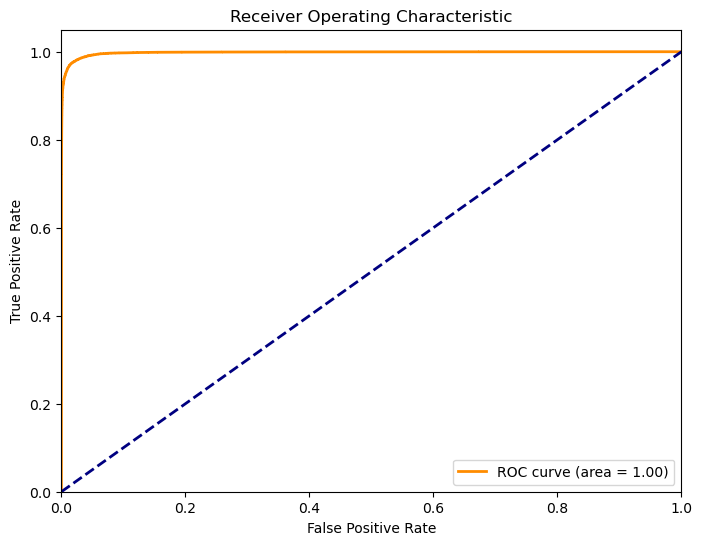

In [81]:
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:, 1])

# Calcular el área bajo la curva ROC
roc_auc = auc(fpr, tpr)

print("AUC: ", roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

# Crear el gráfico
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

El AUC es el Area Under de Curve, refiriendose a aquel porcentage de area que queda bajo la curva ROC la cual es un gráfico que muestra el rendimiento de un modelo de clasificación en todos los umbrales de clasificación y tiene dos parametros, la tasa de Verdaderos Positivos (Sensibilidad) en el eje Y y la tasa de Falsos Positivos (1 - Especificidad) en el eje X. Cuanto más cercano a 1 sea el valor del AUC mejor es el modelo.

Con un AUC de 0.997 este modelo roza la perfección, solo falta ver donde esta teniendo esos pocos fallos. Para ello, mostraré la matriz de confusión.

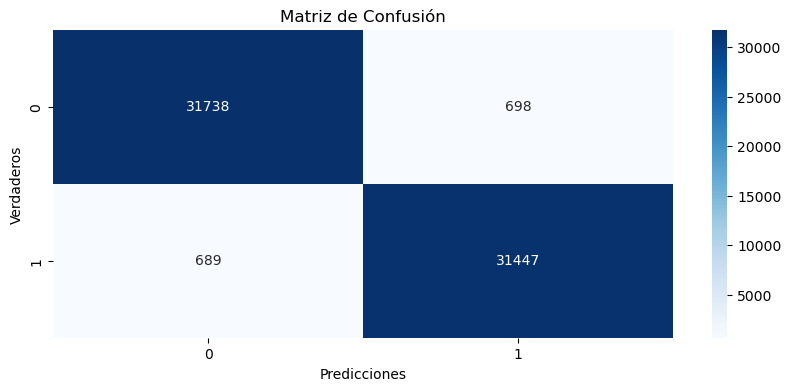

In [44]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Como hemos estado viendo, tenemos muy pocos fallos y estos parecen bastante arbitrarios ya que practicamente hay tantos falsos negativos como falsos positivos.

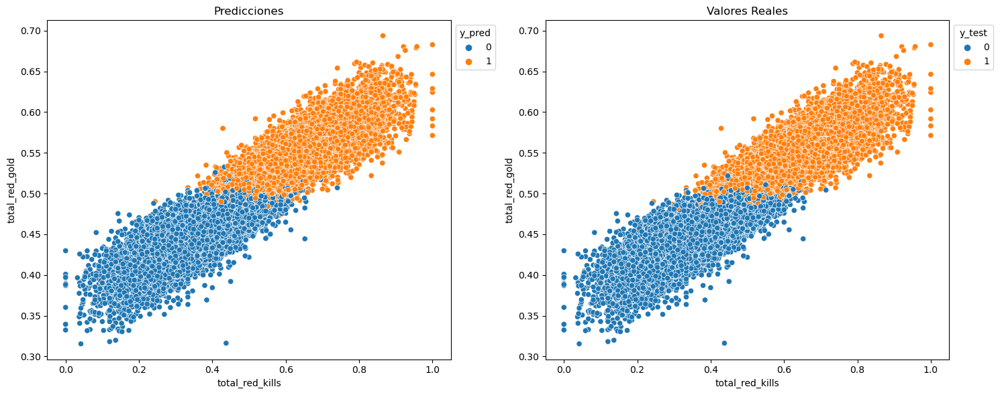

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico de dispersión con y_pred
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_pred, ax=axes[0])
axes[0].set_title('Predicciones')
axes[0].legend(title='y_pred', bbox_to_anchor=(1, 1))

# Gráfico de dispersión con y_test
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_test, ax=axes[1])
axes[1].set_title('Valores Reales')
axes[1].legend(title='y_test', bbox_to_anchor=(1, 1))

# Ajustar el layout
plt.tight_layout()
plt.show()

Impresionante. Es dificil encontrar diferencias entre los gráficos de valores reales contra el de las predicciones.

Un modelo con 98% de accuracy, 0.997 de AUC y en general mostrando cosas que rozan la perfección, pero tampoco hace falta tirarse rositas. Al fin y al cabo era de esperar que este algoritmo fuera capaz de predecir perfectamente los datos, porque tal y como vimos en la anterior entrega y vemos en este últimpo gráfico, ya solo con la variable de oro generado el modelo podría dibujar una línea en medio que clasificara con gran precisión los datos.

Si a eso le sumamos el uso de 3 variables más en las que también se observa una clara división por la variable objetivo y la oportunidad de entrenar el modelo para que aprenda cuales son esas divisiones, era de esperar que la clasificación fuera muy buena.

### Árboles de decision (C. Binaria)

In [98]:
X = data_bin.drop('winning_team', axis=1)
y = data_bin['winning_team']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

model_params={
    'max_leaf_nodes':[50,100,500,5000],
    'min_samples_split':[2,4,6]
}

model = DecisionTreeClassifier(random_state=1234)
gscv = GridSearchCV(model, model_params, cv =3)
model_gs = gscv.fit(X_train, y_train)
print("Best: %f using %s" % (model_gs.best_score_,model_gs.best_params_))

Best: 0.983687 using {'max_leaf_nodes': 100, 'min_samples_split': 6}


Aqui he creado un array de parámetros con distintos posibles valores para encontrar la parametrización más óptima para el modelo y con un 0.98 de precisión, los mejores valores para los hiperparámetros han sido los que se observan el el resultado de la celda de arriba. A continuación, crearé el modelo con esos valores y haré un gráfico mostrando que decisiones ha tomado el modelo para clasificar los datos.

In [99]:
model = DecisionTreeClassifier(max_leaf_nodes=100, min_samples_split=6, criterion='entropy')
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

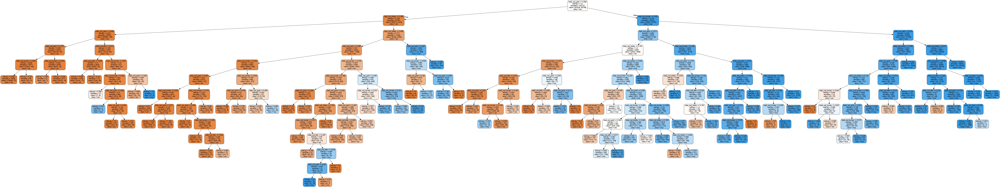

In [71]:
dot_data = StringIO()
export_graphviz(model,out_file=dot_data,filled=True, rounded=True,  class_names = ['win', 'loss'],
                feature_names = data_bin.columns[:-1] )

graph = pydot.graph_from_dot_data(dot_data.getvalue())

Image(graph[0].create_png())

Aunque es un poco grande para la celda, si clicamos se amplia y nos permite ver las decisiones tomadas. En primer lugar, como era de esperar y he mencionado anteriormente, divide los datos dibujando una linea en el 49.9% de oro generado. Después, a sorpresa mia, la variable en la que se fija es en la de los inhibidores destruidos por un lado, y por el otro en las torress. Una vez llegados a este nivel empieza a fijarse en el resto de variables y reduciendo los rangos de los valores de estas, pero esas dos primeras divisiones son sin lugar a duda las de mayor importancia y que aportan mayor infomación para la clasificacion.

In [73]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

Precisión del modelo: 0.9846218175060397


La precisión de este modelo, parece incluso mayor a la de la regresión logística y ciertamente este es el algoritmo del que esperaba el mejor resultado puesto que tal y como ya he mencionado, a simple vista ya era apreciable una division de los datos a partir de un rango de valores de las variables.


Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     32436
           1       0.99      0.98      0.98     32136

    accuracy                           0.98     64572
   macro avg       0.98      0.98      0.98     64572
weighted avg       0.98      0.98      0.98     64572

AUC:  0.9984206888267102


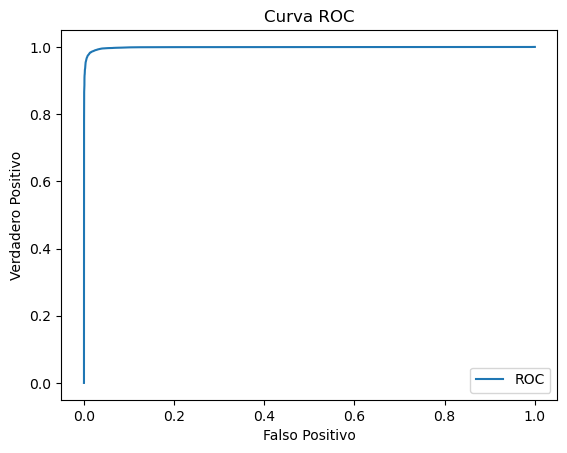

In [100]:
print("\nInforme de Clasificación:")
print(classification_report(y_test, y_pred))

# AUC
y_pred_proba = model.predict_proba(X_test)[:, 1]
print("AUC: ", roc_auc_score(y_test, y_pred_proba))

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label='ROC')
plt.xlabel('Falso Positivo')
plt.ylabel('Verdadero Positivo')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

Una vez más, el AUC es prácticamente perfecto.

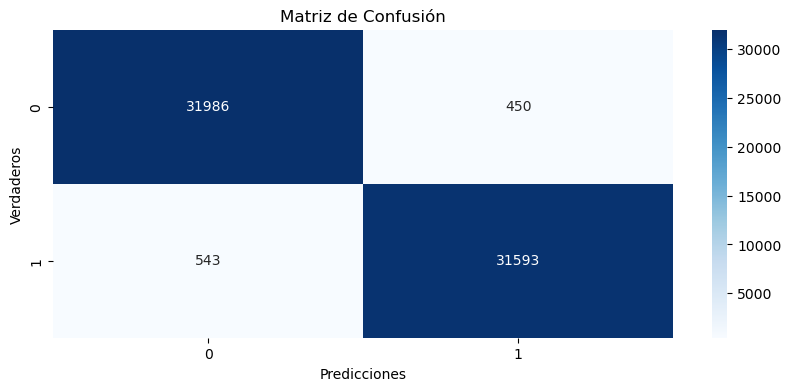

In [101]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Vemos como en efecto, tenemos un error incluso menor que con la regresión logística, y al igual que con ese algoritmo, estos errores parecen bastante arbitrarios con una similar cantidad de falsos positivos y negativos.

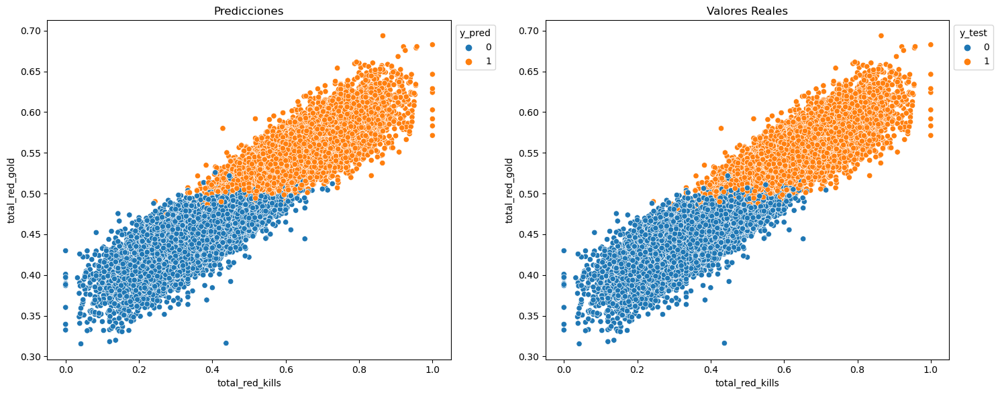

In [75]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico de dispersión con y_pred
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_pred, ax=axes[0])
axes[0].set_title('Predicciones')
axes[0].legend(title='y_pred', bbox_to_anchor=(1, 1))

# Gráfico de dispersión con y_test
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_test, ax=axes[1])
axes[1].set_title('Valores Reales')
axes[1].legend(title='y_test', bbox_to_anchor=(1, 1))

# Ajustar el layout
plt.tight_layout()
plt.show()

Como era de esperar, dos graficos practicamente iguales. Esto se debe a que la naturaleza del algorimo es perfecta para nuestros datos, ya que seguramente solo con separar los datos por menores y mayores al 50% de oro generado ya encontrariamos una precisión descomunal, de hecho vamos a hacerlo.

In [155]:
dtf_esmuytardeymañanatrabajoperomevengoarribaigual = data_bin[data_bin['total_red_gold'] > 0.5]

print((len(dtf_esmuytardeymañanatrabajoperomevengoarribaigual[dtf_esmuytardeymañanatrabajoperomevengoarribaigual['winning_team'] == 1])
       / len(dtf_esmuytardeymañanatrabajoperomevengoarribaigual)) * 100)

97.20409119300437


Efectiviwonder, un 97% de accuracy simplemente haciendo esta pequeña division.

### KNN (C. Binaria)

In [129]:
warnings.filterwarnings('ignore')

X = data_bin.drop('winning_team', axis=1)
y = data_bin['winning_team']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

k_values = [3, 6, 9]

# Saving results
precisions = []
confusion_matrices = []

# Cross validation w/ diff K values
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)

    # 5-Fold Stratified Cross-Validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    y_pred = cross_val_predict(knn, X_train, y_train, cv=cv)

    # Confusion matrices
    cm = confusion_matrix(y_train, y_pred)
    confusion_matrices.append(cm)

    # Precision
    precision = np.mean(y_pred == y_train)
    precisions.append(precision)

# Print results
for k, precision, cm in zip(k_values, precisions, confusion_matrices):
    print(f"K-value: {k}")
    print("Accuracy:", precision)
    print("Confusion matrix:")
    print(cm)
    print()
    print(classification_report(y_train, y_pred))
    print("="*50)


K-value: 3
Accuracy: 0.9824018914482174
Confusion matrix:
[[96190  1738]
 [ 1671 94115]]

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     97928
           1       0.98      0.98      0.98     95786

    accuracy                           0.98    193714
   macro avg       0.98      0.98      0.98    193714
weighted avg       0.98      0.98      0.98    193714

K-value: 6
Accuracy: 0.9821954014681438
Confusion matrix:
[[96501  1427]
 [ 2022 93764]]

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     97928
           1       0.98      0.98      0.98     95786

    accuracy                           0.98    193714
   macro avg       0.98      0.98      0.98    193714
weighted avg       0.98      0.98      0.98    193714

K-value: 9
Accuracy: 0.9823812424502101
Confusion matrix:
[[96191  1737]
 [ 1676 94110]]

              precision    recall  f1-score   support

           0       0.

Aqui lo que hacemos es probar el algoritmo con varios distintos valores de K y evaluamos el rendimiento de cada modelo utilizando validación cruzada estratificada y varias métricas. Esto lo hago para asegurarme de que las muestras son representatvias y también obtengo alguna pista sobre que valor de K se adapta mejor a mis datos aunque para acabar de decidir ese valor más adelante y al igual que con los árboles de decision, haré uso de la libreria GridSearchCV para la parametrización.

En los resultados me he encontrado con que todos los valores de K devuelven un resultado más que satisfactorio, pero el mejor de ellos es el de k = 9 tal y como veremos al obtener los parámetros en la siguiente celda.

In [130]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 9,
 'p': 2,
 'weights': 'uniform'}

In [131]:
model_params={
    'n_neighbors':[3, 6, 9]}

model = KNeighborsClassifier()
gscv = GridSearchCV(model, model_params)
model_gs = gscv.fit(X_train, y_train)

print("Best: %f using %s" % (model_gs.best_score_,model_gs.best_params_))

Best: 0.982577 using {'n_neighbors': 9}


GridSearchCV nos confirma que el valor de K más óptimo es de 9 y ese es el valor que usaré para la creación del modelo.

In [134]:
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train,y_train)

# Predecir con el modelo
y_pred = knn.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

print("\nInforme de Clasificación:")
print(classification_report(y_test, y_pred))

Precisión del modelo: 0.9829182927584712

Informe de Clasificación:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     32436
           1       0.98      0.98      0.98     32136

    accuracy                           0.98     64572
   macro avg       0.98      0.98      0.98     64572
weighted avg       0.98      0.98      0.98     64572



Una precisión de más de un 98% y casi tan buena como la de los árboles de decisión.

AUC:  0.9962755878733474


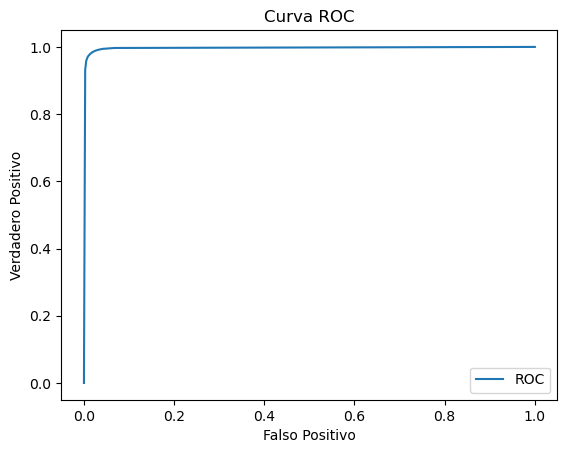

In [136]:
y_pred_proba = knn.predict_proba(X_test)[:, 1]
print("AUC: ", roc_auc_score(y_test, y_pred_proba))

# Curva ROC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label='ROC')
plt.xlabel('Falso Positivo')
plt.ylabel('Verdadero Positivo')
plt.title('Curva ROC')
plt.legend(loc="lower right")
plt.show()

Una vez más un AUC del 99% y como diria Manolo Lama esto ya empieza a ser costumbre.

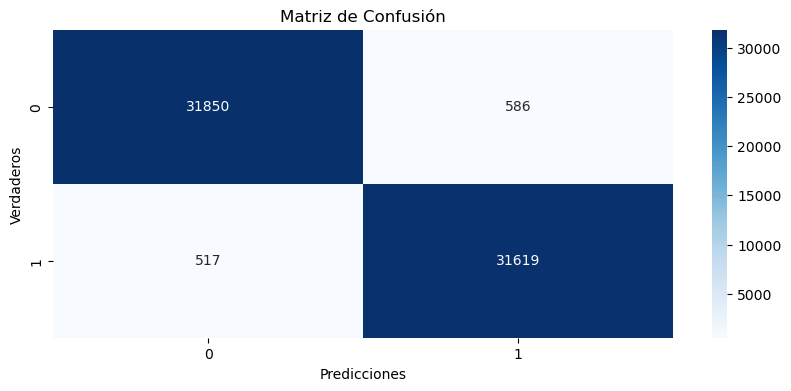

In [135]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

En la matriz de confusion observamos como una vez más el error parece bastante arbitrario con un número parecido de falsos positivos y negativos.

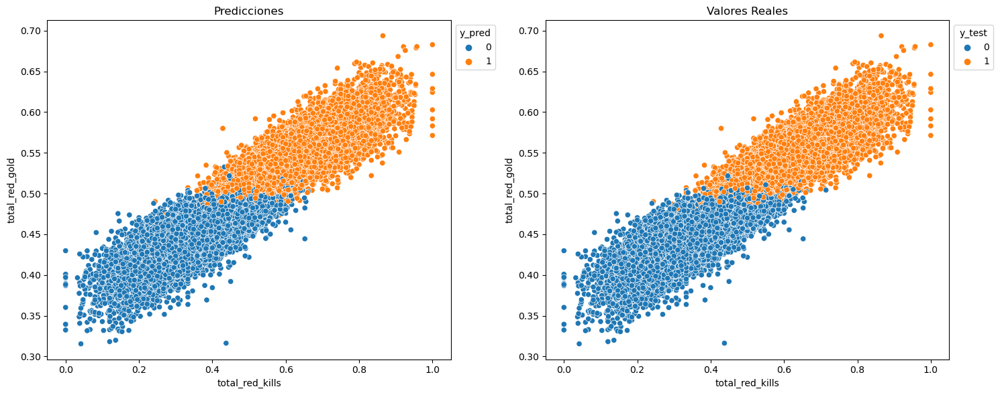

In [137]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico de dispersión con y_pred
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_pred, ax=axes[0])
axes[0].set_title('Predicciones')
axes[0].legend(title='y_pred', bbox_to_anchor=(1, 1))

# Gráfico de dispersión con y_test
sns.scatterplot(data=X_test, x='total_red_kills', y="total_red_gold", hue=y_test, ax=axes[1])
axes[1].set_title('Valores Reales')
axes[1].legend(title='y_test', bbox_to_anchor=(1, 1))

# Ajustar el layout
plt.tight_layout()
plt.show()

Tal y como hemos estado viendo en los resultados una vez más obtenemos una clasificación que reoza la perfeccion. Aunque aqui podemos apreciar como hay ciertos datos dentro de lo que podriamos llamar el "clúster" de victorias que el algoritmo reconoce como derrotas y genera ese mínimo error que hemos visto. Una forma de mejorar el modelo seria observar esos puntos de forma individual y tratar de averiguar el porque los clasifica erroneamente.

### Árboles de decision (C. Multiclase)

In [103]:
X = data_multi.drop('oro', axis=1)
y = data_multi['oro']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

model_params={
    'max_leaf_nodes':[100,400,600,2000],
    'min_samples_split':[2,3,4]
}

model = DecisionTreeClassifier(random_state=1234)
gscv = GridSearchCV(model, model_params, cv =3)
model_gs = gscv.fit(X_train, y_train)
print("Best: %f using %s" % (model_gs.best_score_,model_gs.best_params_))

Best: 0.887241 using {'max_leaf_nodes': 600, 'min_samples_split': 2}


Al igual que antes, he creado un array de parámetros con distintos posibles valores para encontrar la parametrización más óptima para el modelo y con un 0.88 de precisión, los mejores valores para los hiperparámetros han sido los que se observan el el resultado de la celda de arriba. A continuación, crearé el modelo con esos valores y haré un gráfico mostrando que decisiones ha tomado el modelo para clasificar los datos.

In [104]:
model = DecisionTreeClassifier(max_leaf_nodes=600, min_samples_split=2, criterion='entropy')
model.fit(X_train,y_train)
y_pred = model.predict(X_test)

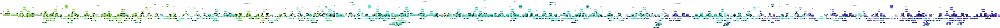

In [107]:
dot_data = StringIO()
export_graphviz(model,out_file=dot_data,filled=True, rounded=True,  
                class_names = ['Humillación', 'Mala partida', 'Partida muy igualada', 'Buena partida', 'Stompeada'],
                feature_names = data_multi.columns[:-1] )

graph = pydot.graph_from_dot_data(dot_data.getvalue())

Image(graph[0].create_png())

Bueno esto va a ser complicado. Lo primero en lo que se fija el modelo para dividir los datos es en el porcentage de asesinatos del equipo, lo cual va bastante acorde a lo que hemos visto en el analisis de correlaciones y de entropía. Tras eso, se fija en rangos de porcentage de experiencia y a partir de ahí empieza a tomar decisiones teniendo en cuenta varíos especificos dependiendo de la parte del árbol en la que nos encontremos.

In [116]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy}')

print("\nInforme de Clasificación:")
print(classification_report(y_test, y_pred))

Precisión del modelo: 0.8885585083317846

Informe de Clasificación:
              precision    recall  f1-score   support

           1       0.83      0.12      0.22        40
           2       0.86      0.87      0.86     13540
           3       0.91      0.91      0.91     38019
           4       0.86      0.86      0.86     12947
           5       0.50      0.19      0.28        26

    accuracy                           0.89     64572
   macro avg       0.79      0.59      0.63     64572
weighted avg       0.89      0.89      0.89     64572



Aqui vemos como tal y como hemos visto arriba, tenemos un 88% de precisión y lo interesante que apreciamos aqui, es que el error no es tan arbitrario como en las clasificaciones binarias, sino que el mayor error se centra en las clases más extremas donde imagino que se confundiran con las no tan de buena y mala partida, es decir 2 y 4. Para confirmar o desmentir mis sospechas crearé la matriz de confusión.

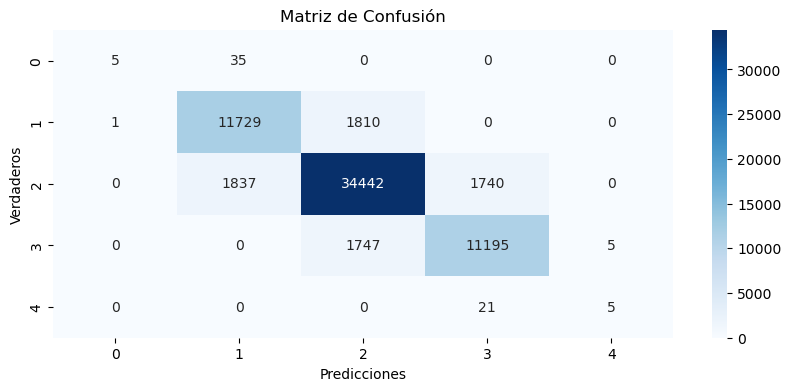

In [110]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
plt.title('Matriz de Confusión')
plt.ylabel('Verdaderos')
plt.xlabel('Predicciones')
plt.show()

Aqui vemos como efectivamente, la immensa mayoria de los valores que corresponden a las clases de humillación y stompeada són absorvidas por las clases no tan extremas, y también podemos ver como el resto de errores si que ya son más arbitrarios y cercanos a lo que llevamos viendo hasta ahora.

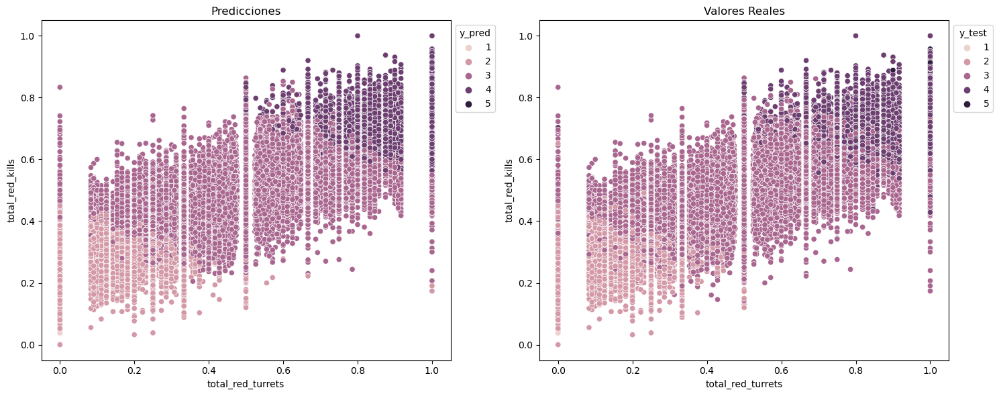

In [113]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Gráfico de dispersión con y_pred
sns.scatterplot(data=X_test, x='total_red_turrets', y="total_red_kills", hue=y_pred, ax=axes[0])
axes[0].set_title('Predicciones')
axes[0].legend(title='y_pred', bbox_to_anchor=(1, 1))

# Gráfico de dispersión con y_test
sns.scatterplot(data=X_test, x='total_red_turrets', y="total_red_kills", hue=y_test, ax=axes[1])
axes[1].set_title('Valores Reales')
axes[1].legend(title='y_test', bbox_to_anchor=(1, 1))

# Ajustar el layout
plt.tight_layout()
plt.show()

Aqui vemos como la razón de estos fallos son principalemente aquellos puntos que desencajan un poco respecto al oro generado. Es decir, en las predicciones vemos como las clases muestran una clara separación, como si estuvieramos jugando a un pinta y colorea, sin embargo en los valores reales ya vamos viendo algunos valores entrelazandose un poco entre las clases (2-3) y (3-4). 

Al final hemos visto como la clasificacion multiclase que hemos intentado en estos datos no ha resultado tan bien como las binarias y eso se debe en gran parte por el hecho de que el ganar o perder una partida es mucho más influyente, o más bien dicho, se deja influir más por datos como el oro generado. Por otro lado, la división de la partida en distintas clases ha sido algo bastante improvisado y por ello probablemente se haya introducido ruido en el modelo, además de que como hemos visto, los árboles de decisiones parten los datos bien en dos, sin embargo al crear clases intermedias puede perderse un poco.

## Conclusiones

Tras la realización de este proyecto hemos visto primero, un análisis de datos del videojuego league of legends. Datos que eran bastante buenos, con poca limpieza por hacer en la que simplemente he mejorado / completado la limpieza que ya fue realizada en la entrega anterior done se limpiaron algunos valores nulos (aunque en esta entrega hemos visto que no había ninguno) y me deshize de ciertos outliers. Gracias a este análisis he podido escoger de la mejor forma las variables para clasificar según mi variable objetivo tanto en la clasificación binaria como en la multiclase, obteniendo unos resultados altamente satisfactorios sobretodo en el caso de las clasificaciones binarias.

En cuánto a los algoritmos, voy a hacer un breve resumen de lo que hemos aprendido de cada uno de ellos:

* Regresión logística (C.Binaria): Al ser una clasificacion binaria de 0 o 1 la regresión logística se ha podido adaptar a la perfección a las necesidades de este caso determinando en un 98% de los casos si ls partida acabó en victoria o no.

* Árboles de decisión (C.Binaria): Este algoritmo es el que ha acabado obteniendo los mejores resultados como era de esperar por la naturaleza de los datos, como hemos visto se ha basado principalmente en las variables de oro primero y inhibidores y torres más tarde para conseguir una clasificación exitosa de los datos.

* KNN (C.Binaria): El modelo basado en KNN también ha sido capaz de adaptarse a la perfeccion a los datos, a priori este era el único algoritmo que me hacia dudar de su utilidad en este caso, puesto que todos los puntos estaban comprimidos en un rango muy pequeño, y si bien el hecho de que los puntos se encuentren cerca los unos de los otros puede ayudar a la clasificacion, también me daba miedo que actuara como un arma de doble filo confundiendo ambas clases.

* Árboles de decisión (C.Mulitclase): Con este algoritmo hemos observado un declive en la precisión encontrada hasta ahora, con un contundente pero decepcionante 88% de precisión (solo es decepcionante porque veniamos de 3 algoritmos con más del 98% de precisión). Esto probablemente haya sucedido debido a que, al dividir los datos en 5 clases no exisita una división intrinseca en los datos separando estas clases, al contrario que en la clasificación binaria donde sí que la habia al clasificar según victoria o derrota.

Tras usar y analizar cada uno de los algortimos hemos podido concluir que debido a la naturaleza de los datos, los modelos en las clasificaciones binarias se han adaptado practicamente a la perfección clasificando los datos correctamente en más del 98% de los casos, sin embargo ya hemos visto que esto tampoco tiene tanto mérito como parece porque simplemente haciendo una simple división por el 50% del oro generado ya hubiesemos sido capaces de clasificar correctamente el 97% de los datos. 
En cuánto a la clasificación multiclase, hemos visto como al romper esa tendencia de solo dos clases y tener que encontrar otros medios para separarlos correctamente, la precisión del algoritmo de árboles de decisión cayó hasta el 88%. Aún así la clasificacion obtenida es bastante correcta.